In [133]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [134]:
DIM_X = 100
DIM_Y = 100
DT = 0.1
DX = 0.1
DY = 0.1

In [135]:
SIGMA = np.zeros([DIM_Y, DIM_X])
EPS = np.ones([DIM_Y, DIM_X])#*8.854e-12
MU = 1.0

In [136]:
for i in range(int(DIM_Y/4)):
    for j in range(int(DIM_X/4)):
        #EPS[int(DIM_Y/4)+i, int(DIM_X/4)+j] = 0.1
        SIGMA[int(DIM_Y/4)+i, int(DIM_X/4)+j] = 10

In [137]:
SIGMA[2, 3]

0.0

In [138]:
print('{:10}'.format(EPS[3, 4]))

       1.0


In [139]:
def c1(x_idx, y_idx):
    return (1.0 - SIGMA[x_idx, y_idx]*DT/(2.0*EPS[x_idx, y_idx])) / (1.0 + SIGMA[x_idx, y_idx]*DT/(2.0*EPS[x_idx, y_idx]))

In [140]:
def c2(x_idx, y_idx):
    return DT / (EPS[x_idx, y_idx] * (1.0 + SIGMA[x_idx, y_idx]*DT/(2.0*EPS[x_idx, y_idx])))

In [141]:
def dHy_dx(x_idx, y_idx, m_field):
    return (m_field[x_idx, y_idx][1] - m_field[x_idx-1, y_idx][1]) / DX

In [142]:
def dHx_dy(x_idx, y_idx, m_field):
    return (m_field[x_idx, y_idx][0] - m_field[x_idx, y_idx-1][0]) / DY

In [143]:
def dEz_dx(x_idx, y_idx, e_field):
    return (e_field[(x_idx+1)%DIM_X, y_idx][2] - e_field[x_idx, y_idx][2]) / DX

In [144]:
def dEz_dy(x_idx, y_idx, e_field):
    return (e_field[x_idx, (y_idx+1)%DIM_Y][2] - e_field[x_idx, y_idx][2]) / DY

In [145]:
c1(3, 4)

1.0

In [146]:
np.ones(3)

array([1., 1., 1.])

In [147]:
plt.rcParams['figure.figsize'] = 15, 5

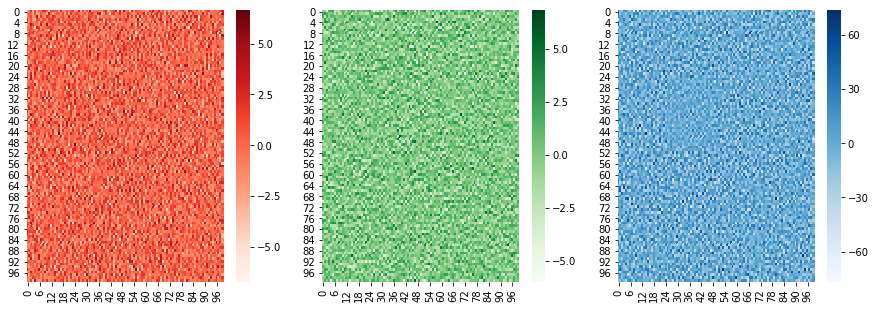

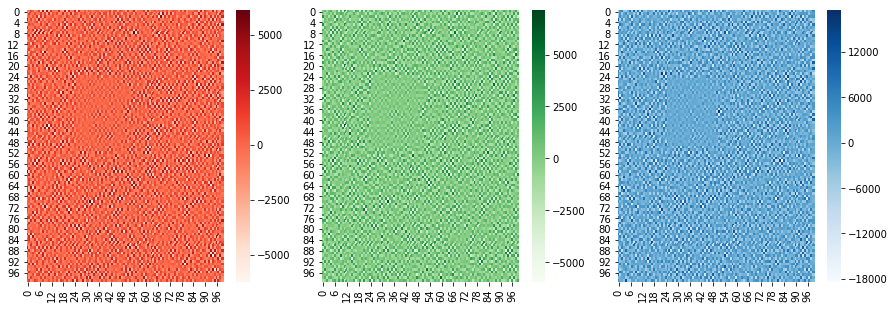

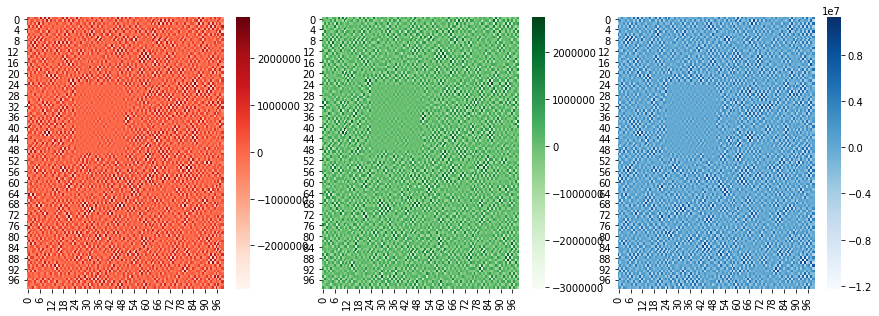

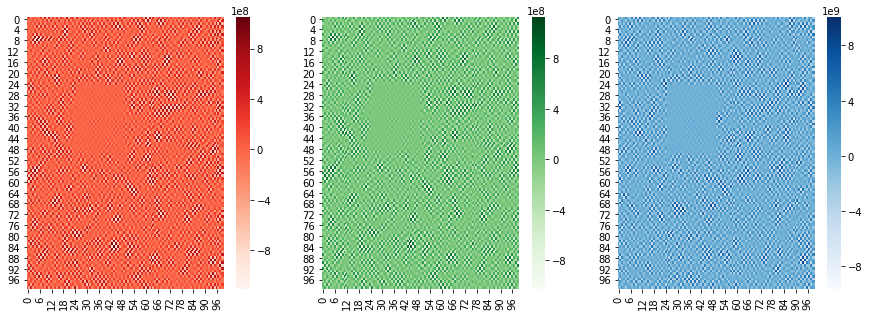

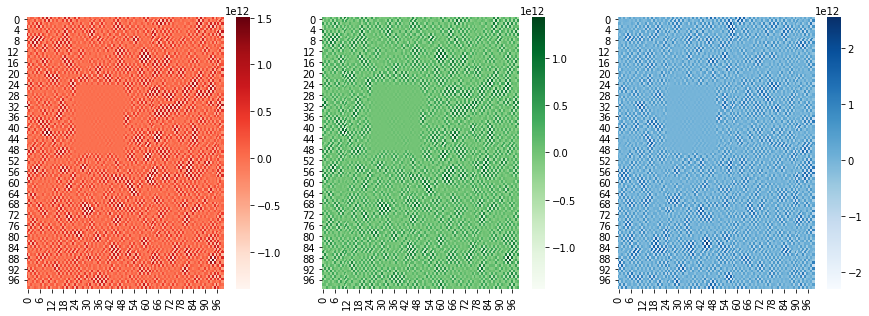

...

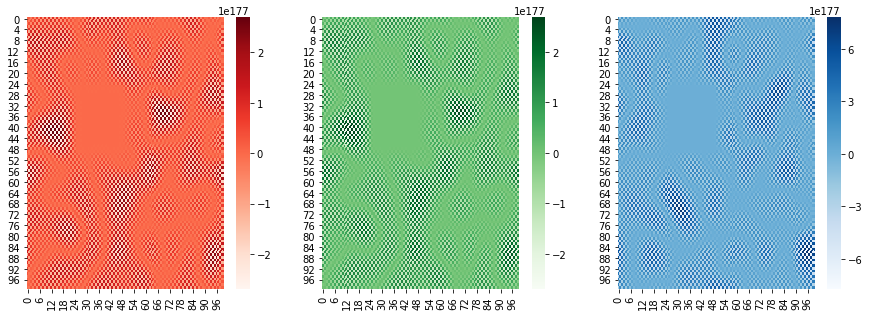

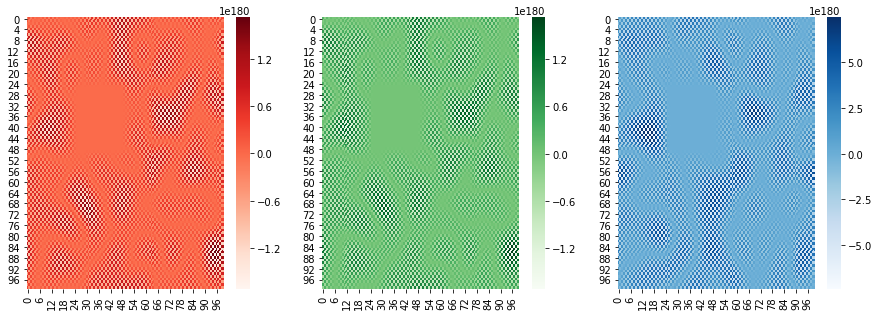

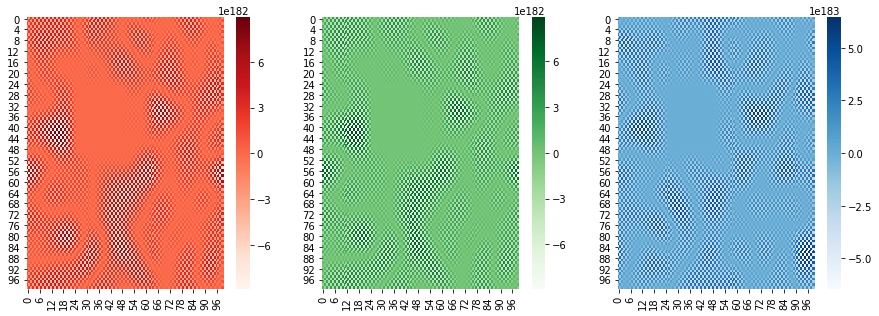

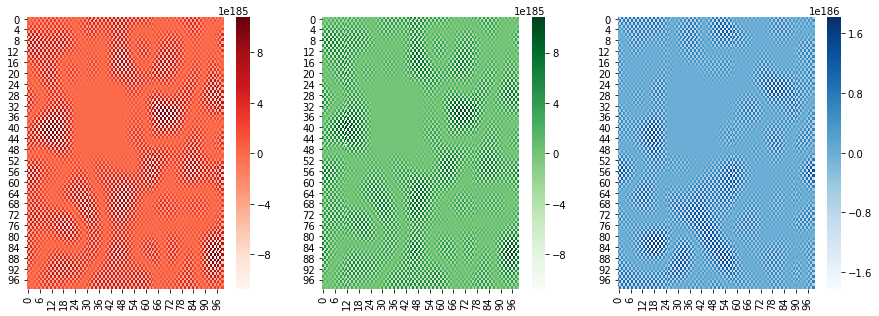

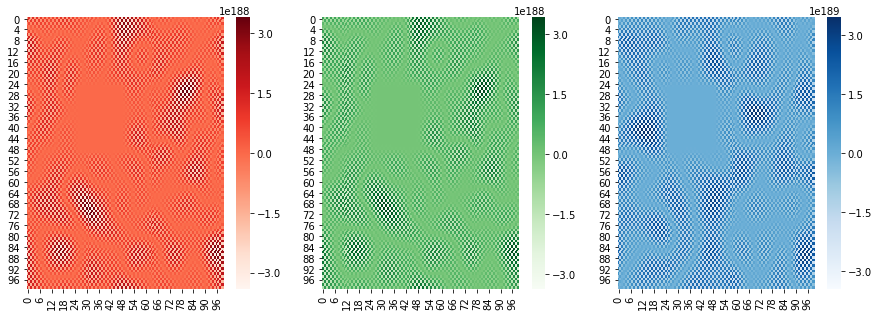

In [148]:
e_field = np.random.randn(DIM_X*DIM_Y*3).reshape([DIM_X, DIM_Y, 3])
m_field = np.random.randn(DIM_X*DIM_Y*3).reshape([DIM_X, DIM_Y, 3])
    
for i in range(200):
    prev_e_field = e_field.copy()
    prev_m_filed = m_field.copy()
    
    for y_idx in range(DIM_Y):
        for x_idx in range(DIM_X):
            e_field[x_idx, y_idx][2] = c1(x_idx, y_idx)*prev_e_field[x_idx, y_idx][2] \
                                    + (c2(x_idx, y_idx)/DX) * dHy_dx(x_idx, y_idx, prev_m_filed) \
                                    - (c2(x_idx, y_idx)/DY) * dHx_dy(x_idx, y_idx, prev_m_filed)
            #print(e_field[x_idx, y_idx][2])
            m_field[x_idx, y_idx][0] = prev_m_filed[x_idx, y_idx][0] - (DT/MU)*dEz_dy(x_idx, y_idx, prev_e_field)
            m_field[x_idx, y_idx][1] = prev_m_filed[x_idx, y_idx][1] + (DT/MU)*dEz_dx(x_idx, y_idx, prev_e_field)
            #print(m_field[x_idx, y_idx][1])
            
    if (i % 3) == 0:
        plt.clf()
        plt.subplot(131)
        sns.heatmap(m_field[:, :, 0], cmap="Reds")
        #plt.show()
        #plt.clf()
        plt.subplot(132)
        sns.heatmap(m_field[:, :, 1], cmap="Greens")
        #plt.show()
        #plt.clf()
        plt.subplot(133)
        sns.heatmap(e_field[:, :, 2], cmap="Blues")
        plt.show()
        print('='*100)
    #print(e_field[:, :][2])
    #print(m_field[:, :][0:1])
    

In [ ]:
e_field[:, :, 2]

In [61]:
m_field

array([[[        nan,         nan,  0.72269411],
        [        nan,         nan,  0.60307944],
        [        nan,         nan,  0.60020545],
        ...,
        [        nan,         nan, -2.7201497 ],
        [        nan,         nan, -0.27981354],
        [        nan,         nan,  0.8252744 ]],

       [[        nan,         nan, -1.52895267],
        [        nan,         nan, -0.57057045],
        [        nan,         nan, -0.12228627],
        ...,
        [        nan,         nan, -0.34977875],
        [        nan,         nan,  0.91935193],
        [        nan,         nan,  0.78843526]],

       [[        nan,         nan,  1.20469178],
        [        nan,         nan,  2.00132927],
        [        nan,         nan, -0.44516287],
        ...,
        [        nan,         nan, -0.76854615],
        [        nan,         nan, -0.3064858 ],
        [        nan,         nan,  1.0781717 ]],

       ...,

       [[        nan,         nan,  0.12869289],
        [  